In [1]:
%load_ext autoreload

import numpy as np
import numpy.random as npr
import torch
import scipy as sp
from scipy import interpolate
from collections import defaultdict

import json
import pandas as pd
import os
from tqdm import tqdm
pd.set_option('display.max_rows', None)

import matplotlib.pyplot as plt
plt.style.use('bmh')
from matplotlib import cm
plt.rcParams.update({'figure.max_open_warning': 0})
import seaborn as sns

import dmc2gym

import pickle as pkl
import itertools
import operator
from collections import namedtuple
from glob import glob
import textwrap

import os
import yaml

import sys
# sys.path.append('../batch')
# %autoreload 2
# %aimport bcq

import omegaconf
from omegaconf import OmegaConf

%autoreload 2
from mve.analysis import plot_ac_exp

from IPython.display import display
%matplotlib inline

In [2]:
def sweep_summary(root):
    configs = {}
    all_summary = []
    for d in glob(f'{root}/*/'):
        eval_f = f'{d}/eval.csv'
        try:
            eval_df = pd.read_csv(eval_f)
        except:
            continue
        print
#         last_eval_rew = eval_df.episode_reward.values[-10:].mean()
        last_eval_rew = eval_df.episode_reward.values[-1]
        best_eval_rew = eval_df.episode_reward.values.max()
        fname = f'{d}/config.yaml'
        if not os.path.exists(fname):
            fname = f'{d}/.hydra/config.yaml'
            assert os.path.exists(fname)
        config = OmegaConf.load(fname)
        configs[d] = config
        fname = f'{d}/overrides.yaml'
        if not os.path.exists(fname):
            fname = f'{d}/.hydra/overrides.yaml'
            assert os.path.exists(fname)
        overrides = OmegaConf.load(fname)
        summary = dict(x.split('=') for x in overrides)
        summary['best_eval_rew'] = best_eval_rew
        summary['last_eval_rew'] = last_eval_rew
        summary['d'] = d
        summary['env_name'] = config.env_name
        all_summary.append(summary)
    
    if len(all_summary) == 0:
        print('No experiments with eval data found.')
        return [None]*4
        
    all_summary = pd.DataFrame(all_summary)
    for col in all_summary.columns:
        if col != 'env_name' and len(all_summary[col].unique()) == 1:
            all_summary.drop(col,inplace=True,axis=1)

    filt = ['env_name', 'seed']
    groups = [x.split('=')[0] for x in overrides]
    groups = [x for x in groups if x not in filt]
    groups = list(set(groups) & set(all_summary.columns))
    groups = ['env_name'] + groups
    groups = all_summary.groupby(groups)
    agg = groups.agg(['mean', 'std'])

    return all_summary, groups, agg, configs

def plot_rew(root, ax=None, label=None):
    if ax is None:
        nrow, ncol = 1, 1
        fig, ax = plt.subplots(nrow, ncol, figsize=(6*ncol, 4*nrow))
        ax.set_xlabel('1k Updates')
    
    try:
        eval_df = pd.read_csv(f'{root}/eval.csv')
    except:
        return
    l, = ax.plot(eval_df.step/1000, eval_df.episode_reward, label=label)

def plot_rew_list(ds, title=None, ax=None):
    nrow, ncol = 1, 1
    if ax is None:
        fig, ax = plt.subplots(nrow, ncol, figsize=(6*ncol, 4*nrow))
    ax.set_xlabel('1k Updates')
#     ax.set_ylim(0, 1000)
    if title is not None:
        ax.set_title(title)
    for d in ds:
        label = d.split('/')[-2]
        plot_rew(d, ax=ax, label=label)
    ax.legend()

def plot_all_rew(root):
    nrow, ncol = 1, 1
    fig, ax = plt.subplots(nrow, ncol, figsize=(6*ncol, 4*nrow))
    ax.set_xlabel('1k Updates')
    title = '/'.join(root.split('/')[-3:])
    ax.set_title(title)
#     ax.set_ylim(0, 1000)
    for d in glob(f'{root}/*/'):
        label = d.split('/')[-2]
        plot_rew(d, fig=fig, label=label)
    ax.legend()

def plot_agg(df, agg, ncol=4):
    nrow = int(np.ceil(len(agg)/ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(6*ncol, 4*nrow))
    if nrow == 1 and ncol == 1:
        axs = [axs]
    else:
        axs = axs.ravel()
    for ax, (r, sub_df) in zip(axs, agg.iterrows()):
        if isinstance(r, str):
            r = [r]
        I = df.index == df.index
        for k, v in zip(agg.index.names, r):
            I = I & (df[k] == v)
        df_I = df[I]
        title = '.'.join([f'{k}={v}' for k,v in zip(agg.index.names, r)])
        title = title.replace('agent.params.', '').replace('model.params.', '')
        title = '\n'.join(textwrap.wrap(title, 45))
        plot_rew_list(df_I.d.values, title=title, ax=ax)
    fig.tight_layout()

def plot_ablation(
    groups, title, xmax=None,
    save=None, lw=3,
    xlabel='Timestep', ylabel='Reward',
    legend=False, sac_lim=None
):
    fig, ax = plt.subplots(1, 1, figsize=(4.5,3))

    for group in groups:
        all_df = []
        min_step = None
        for root in group['roots']:
            eval_f = f'{root}/eval.csv'
            df = pd.read_csv(eval_f)
            if min_step is None or max(df['step']) < min_step:
                min_step = max(df['step'])
            df['f'] = eval_f
            all_df.append(df)

        step_interp = np.linspace(0, min_step, num=20)
        all_df_interp = []
        for df in all_df:
            rew_interp = np.interp(step_interp, df['step'], df['episode_reward'])
            df_interp = pd.DataFrame({'step': step_interp, 'rew': rew_interp})
            all_df_interp.append(df_interp)
        all_df_interp = pd.concat(all_df_interp)
        label = group['tag'] if legend else None
        if 'color' in group:
            sns.lineplot(x='step', y='rew', data=all_df_interp,
                         ax=ax, linewidth=lw, label=label, color=group['color'])
        else:
            sns.lineplot(x='step', y='rew', data=all_df_interp,
                         ax=ax, linewidth=lw, label=label)
                
    ax.axhline(sac_lim, lw=lw, linestyle='--', color='k')

    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    if xmax is not None:
        ax.set_xlim(0, xmax)

    ax.set_xlabel('Timestep')
    ax.set_ylabel('Reward')
    ax.set_title(title)
    fig.tight_layout()
    
    if save is not None:
        fig.savefig(save)
        os.system(f'convert -trim {save} {save}')

best_eval_rew  \
                                                                                                                                                                 mean   
env_name      learn_temp.params.init_targ_entr learn_temp.params.final_targ_entr env           agent.params.horizon learn_temp.params.entr_decay_factor                 
mbpo_ant      -1                               -128                              mbpo_ant      3                    16.0                                  4113.405363   
                                                                                               5                    0.5                                   5673.371523   
                                               -16                               mbpo_ant      3                    0.125                                 8691.754762   
                                                                                                                    2.0                                   9196.411888   
                                               -3                                mbpo_ant      3                    64.0                                  8834.382661   
                                                                                               5                    0.5                                   6998.344368   
                                               -8                                mbpo_ant      3                    0.25                                  8088.678435   
              -2                               -128                              mbpo_ant      5                    32.0                                  2676.685141   
                                               -16                               mbpo_ant      3                    0.125                                 9468.783788   
                                               -256                              mbpo_ant      3                    16.0                                  3153.238526   
                                               -3                                mbpo_ant      5                    0.125                                 5483.420411   
                                                                                                                    1.0                                   6552.052336   
                                               -32                               mbpo_ant      3                    2.0                                   7213.037763   
                                                                                                                    4.0                                   7382.302998   
                                               -4                                mbpo_ant      5                    0.25                                  5948.831132   
                                               -512                              mbpo_ant      3                    0.5                                   7039.332226   
              0                                -16                               mbpo_ant      3                    8.0                                   7752.470613   
                                               -256                              mbpo_ant      3                    1.0                                   5985.513942   
                                               -32                               mbpo_ant      5                    8.0                                   2958.842129   
                                               0                                 mbpo_ant      3                    16.0                                  7709.101833   
mbpo_humanoid -1                               -1                                mbpo_humanoid 3                    0.015625                             10301.198586   
                                               -128                              mbpo_humanoid 3

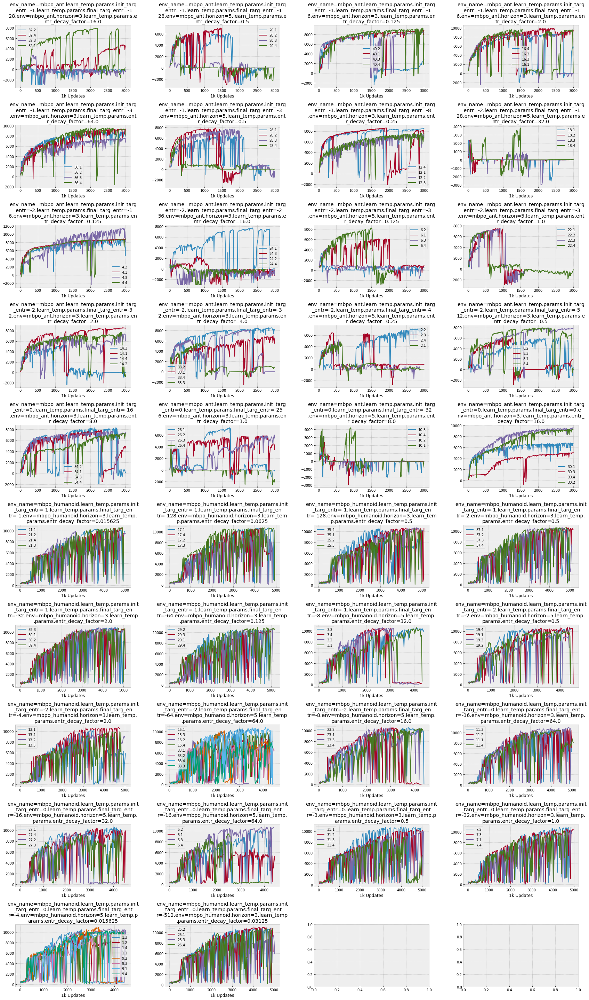

In [11]:
d = '../exp/2020.04.23/1610_mbpo_humanoid_ant/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg)

['env=mbpo_humanoid', 'seed=1', 'experiment=mbpo_humanoid_ant', 'log_save_tb=false', 'agent.params.horizon=5', 'learn_temp.params.init_targ_entr=-2', 'learn_temp.params.final_targ_entr=-2', 'learn_temp.params.entr_decay_factor=0.5']
['env=mbpo_humanoid', 'seed=2', 'experiment=mbpo_humanoid_ant', 'log_save_tb=false', 'agent.params.horizon=5', 'learn_temp.params.init_targ_entr=-2', 'learn_temp.params.final_targ_entr=-2', 'learn_temp.params.entr_decay_factor=0.5']
['env=mbpo_humanoid', 'seed=3', 'experiment=mbpo_humanoid_ant', 'log_save_tb=false', 'agent.params.horizon=5', 'learn_temp.params.init_targ_entr=-2', 'learn_temp.params.final_targ_entr=-2', 'learn_temp.params.entr_decay_factor=0.5']
['env=mbpo_humanoid', 'seed=4', 'experiment=mbpo_humanoid_ant', 'log_save_tb=false', 'agent.params.horizon=5', 'learn_temp.params.init_targ_entr=-2', 'learn_temp.params.final_targ_entr=-2', 'learn_temp.params.entr_decay_factor=0.5']


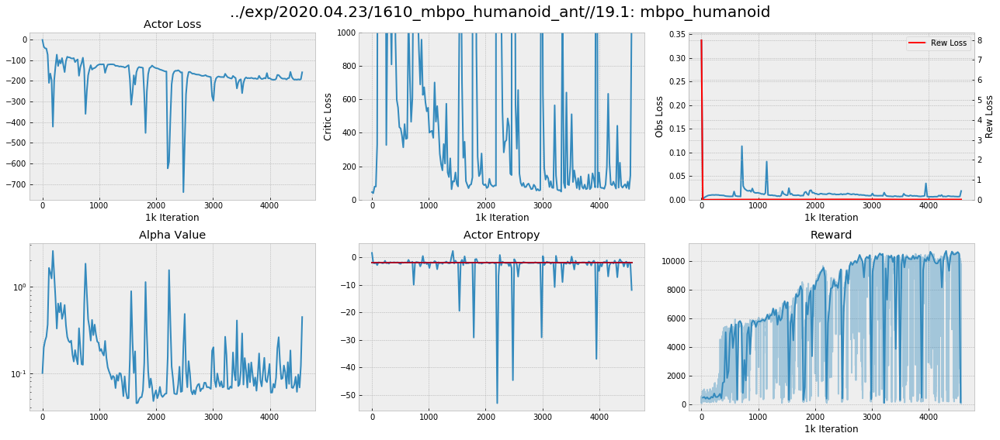

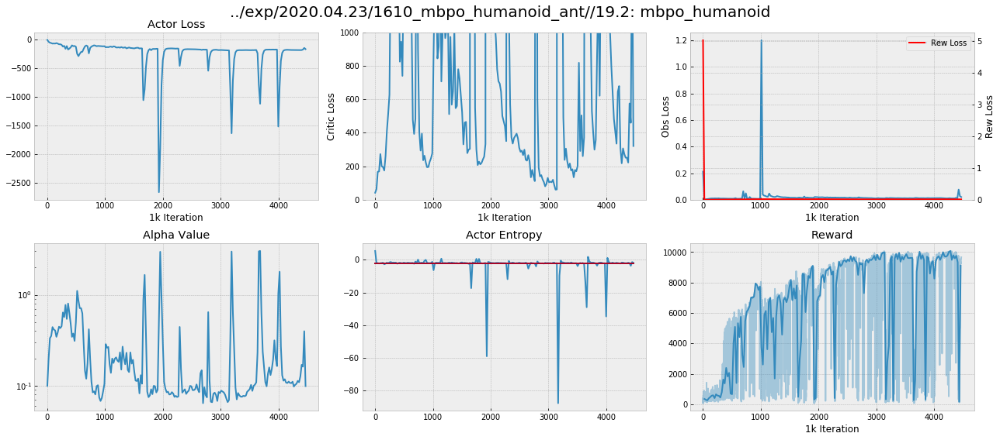

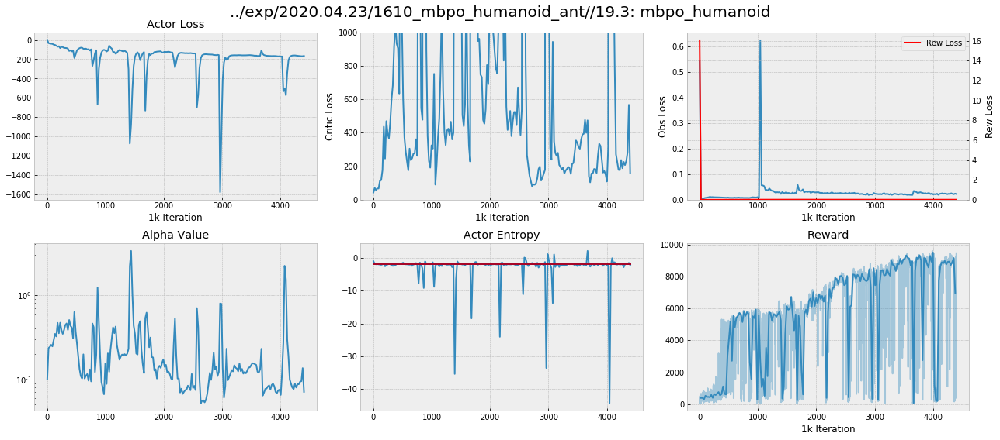

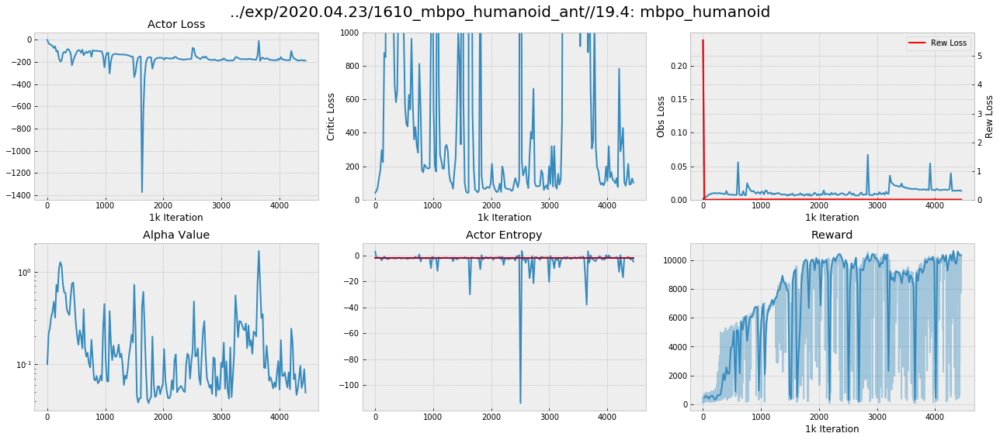

In [12]:
d = '../exp/2020.04.23/1610_mbpo_humanoid_ant/'
for i in range(1,5):
    plot_ac_exp(f'{d}/19.{i}', Qmax=1000)

best_eval_rew             last_eval_rew  \
                                      mean         std          mean   
env_name      clip_grad_norm                                           
mbpo_humanoid 0.1              6021.929653  215.551545   4289.965199   
              1.0              6643.173477  791.009954   5171.731446   
              5.0              6728.204954  457.648476   4996.974077   
              null             6901.357246  903.063861   5908.057532   

                                           
                                      std  
env_name      clip_grad_norm               
mbpo_humanoid 0.1             2601.444028  
              1.0             1050.644137  
              5.0             3157.958434  
              null             959.981921

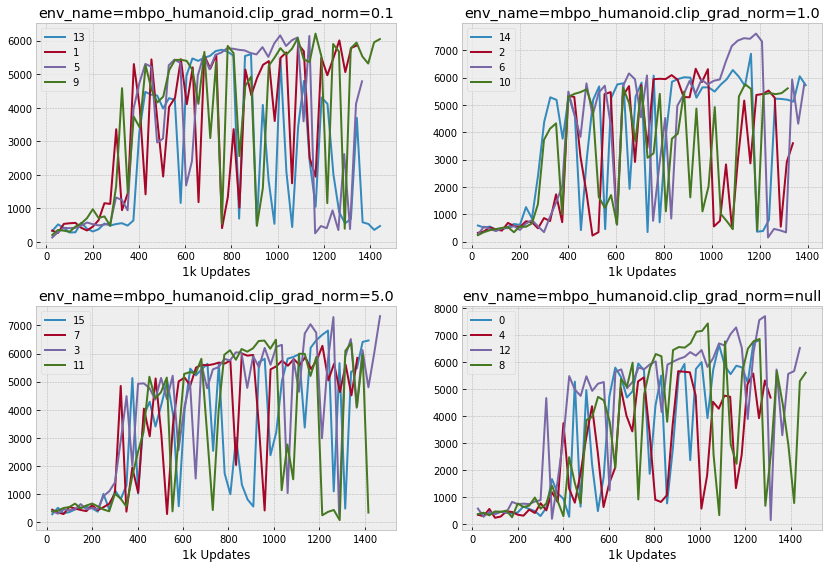

In [16]:
d = '../exp/2020.05.01/1350_sac_mve_humanoid_grad_clip/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg, ncol=2)

In [ ]:
d = '../exp/2020.05.01/1350_sac_mve_humanoid_grad_clip/'
for i in [14,2,6,10]:
    plot_ac_exp(f'{d}/{i}', Qmax=1000)

best_eval_rew              last_eval_rew             
                                 mean          std          mean          std
env_name clip_grad_norm                                                      
mbpo_ant 0.1              8425.339899  1309.558334   8217.556901  1529.676738
         1.0              6920.763521  1093.267264   6325.149405  1128.690765
         5.0              8646.642682  1159.303525   7738.979102  2470.518004
         null             7899.443988   276.609838   5504.266736  4234.726859

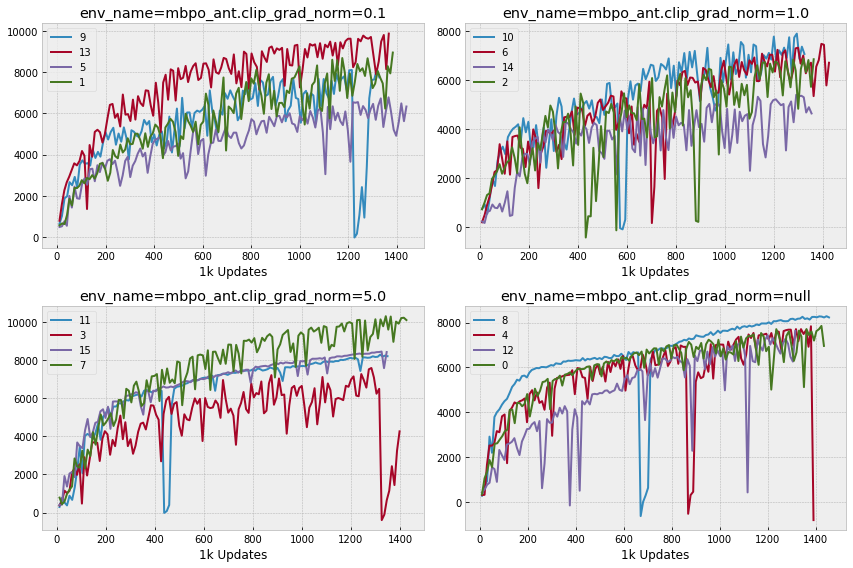

In [15]:
d = '../exp/2020.05.02/0442_sac_mve_ant_grad_clip/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg, ncol=2)

best_eval_rew  \
                                                                                                                                                                 mean   
env_name      learn_temp.params.init_targ_entr learn_temp.params.final_targ_entr env           agent.params.horizon learn_temp.params.entr_decay_factor                 
mbpo_cheetah  -1                               -128                              mbpo_cheetah  3                    64.0                                  4899.580792   
                                               -3                                mbpo_cheetah  3                    0.5                                   4362.170077   
                                                                                               5                    2.0                                   7904.454834   
                                               -512                              mbpo_cheetah  5                    0.015625                              7328.764491   
                                               -64                               mbpo_cheetah  5                    0.25                                  5246.982226   
                                                                                                                    16.0                                  5045.807335   
                                               -8                                mbpo_cheetah  3                    1.0                                  13756.582558   
              -2                               -128                              mbpo_cheetah  3                    0.015625                             11845.620688   
                                                                                                                    0.25                                 12343.936303   
                                                                                               5                    0.015625                              6138.013262   
                                               -4                                mbpo_cheetah  3                    2.0                                   4962.116130   
                                               -8                                mbpo_cheetah  3                    8.0                                   8345.477358   
              0                                -128                              mbpo_cheetah  5                    8.0                                   5536.827099   
                                               -256                              mbpo_cheetah  5                    0.03125                              10745.566256   
                                               -3                                mbpo_cheetah  5                    0.03125                               7727.376447   
                                               -32                               mbpo_cheetah  5                    2.0                                   9784.148197   
                                               -4                                mbpo_cheetah  3                    0.015625                              5235.841119   
                                               -512                              mbpo_cheetah  3                    1.0                                  11060.263352   
                                                                                               5                    8.0                                   2900.892758   
                                               0                                 mbpo_cheetah  3                    64.0                                 11132.308752   
mbpo_hopper   -1                               -16                               mbpo_hopper   3                    32.0                                  3718.803493   
                                                                                                

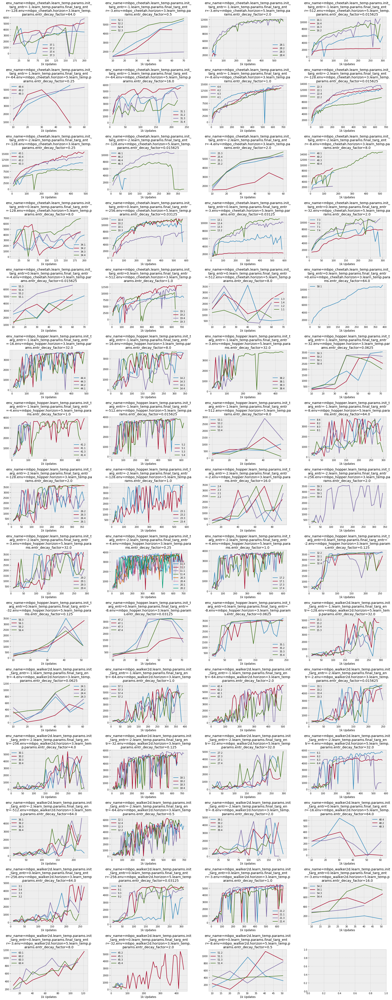

In [8]:
d = '../exp/2020.04.23/1612_mbpo_others/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg)

best_eval_rew  \
                                                                                                                                                                      mean   
env_name     learn_temp.params.init_targ_entr learn_temp.params.final_targ_entr env                 agent.params.horizon learn_temp.params.entr_decay_factor                 
gym_ant      -1                               -16                               poplin_ant          3                    0.015625                              1985.305611   
                                              -256                              poplin_ant          3                    32.0                                  2107.139257   
                                              -32                               poplin_ant          3                    0.5                                   2267.173985   
                                              -512                              poplin_ant          3                    8.0                                    656.836402   
                                              -64                               poplin_ant          5                    0.125                                 1175.682827   
             -2                               -16                               poplin_ant          3                    4.0                                   3492.848423   
                                              -2                                poplin_ant          5                    0.5                                   1101.144611   
                                              -256                              poplin_ant          3                    16.0                                  2730.669713   
                                              -3                                poplin_ant          3                    0.0625                                2353.370877   
                                                                                                                         64.0                                  2524.020645   
                                                                                                    5                    4.0                                   1295.076220   
                                              -4                                poplin_ant          3                    0.03125                               3088.638835   
                                                                                                                         0.125                                  719.325339   
                                              -64                               poplin_ant          3                    0.015625                              3854.932036   
             0                                -256                              poplin_ant          3                    0.0625                                3359.315660   
                                              -4                                poplin_ant          3                    0.5                                   3217.687637   
                                              -64                               poplin_ant          5                    8.0                                   1459.598748   
gym_cheetah  -1                               -1                                poplin_cheetah      3                    64.0                                  7837.417749   
                                              -2                                poplin_cheetah      3                    0.25                                  6396.781465   
                                              -256                              poplin_cheetah      5                    0.015625                              8104.643584   
                                              -3                                poplin_cheetah      3                    4.0                               

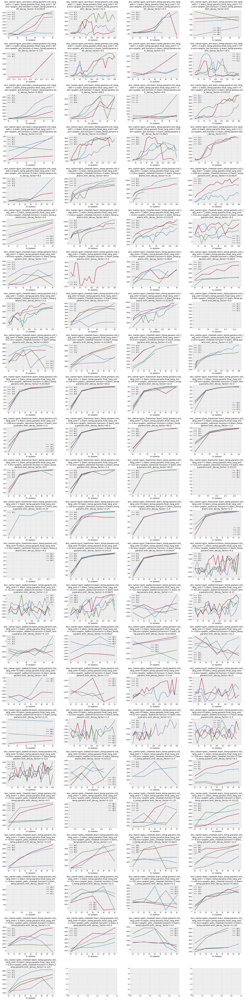

In [9]:
d = '../exp/2020.04.23/1614_poplin_loco/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg)

best_eval_rew              last_eval_rew  \
                                     mean          std          mean   
env_name      env                                                      
mbpo_ant      mbpo_ant        8805.022143  1091.058545   8621.485380   
mbpo_cheetah  mbpo_cheetah   13094.488912  5830.021460  12656.211099   
mbpo_hopper   mbpo_hopper     3956.653599   142.464556   3256.301220   
mbpo_humanoid mbpo_humanoid   6386.772264   227.010686   5637.846725   
mbpo_walker2d mbpo_walker2d   5843.412951   121.405575   5610.281525   

                                          
                                     std  
env_name      env                         
mbpo_ant      mbpo_ant        705.987913  
mbpo_cheetah  mbpo_cheetah   5596.514439  
mbpo_hopper   mbpo_hopper     629.298754  
mbpo_humanoid mbpo_humanoid  1541.786410  
mbpo_walker2d mbpo_walker2d   252.910184

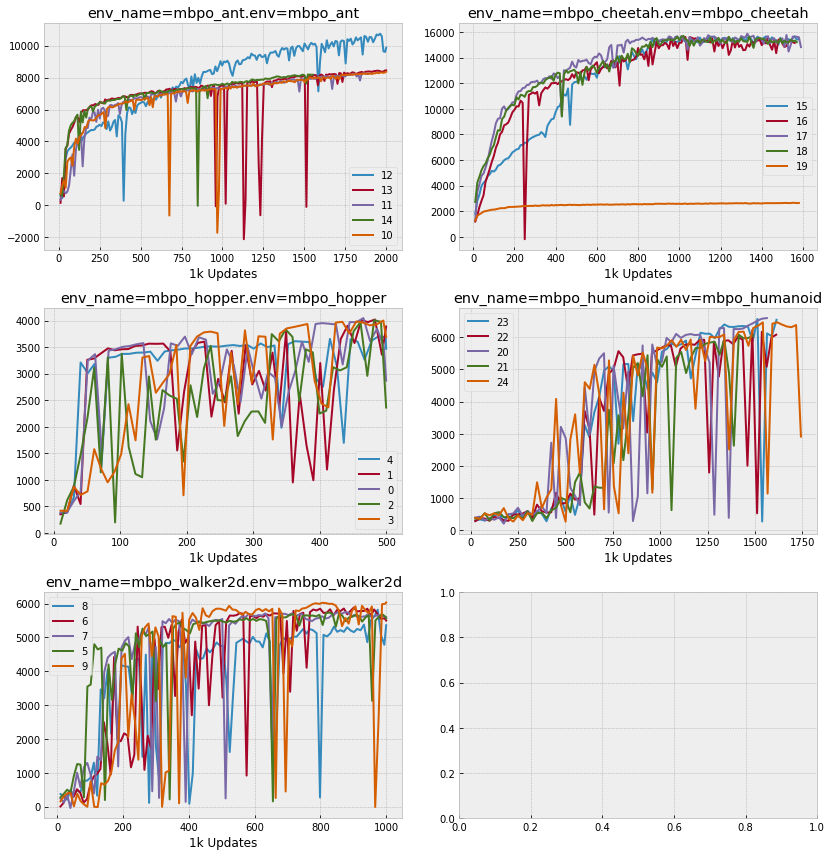

In [10]:
d = '../exp/old/2020.03.27/2011_sac_mve_mbpo/'
all_summary, groups, agg, configs = sweep_summary(d)
# display(all_summary)
display(agg)
plot_agg(all_summary, agg, ncol=2)